In [100]:
from datasets import load_dataset, load_from_disk
import dill as pickle
import pandas as pd
import string,re
from spectral_explain.dataloader import get_dataset, HotpotQA


%load_ext autoreload
%autoreload 2


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Analyse Drop Benchmark Results

Loading HotpotQA dataset
num_explain > test set size. Explaining all 39 test samples instead.
39


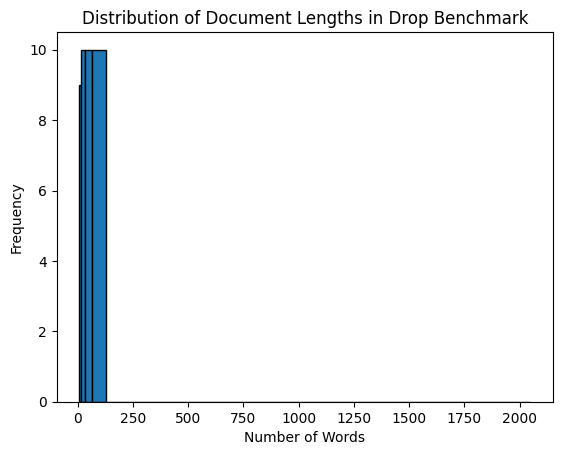

In [102]:

dataset = get_dataset(dataset = 'drop', num_explain = 10000, seed = 42)
print(len(dataset))
import matplotlib.pyplot as plt

# # Plot the distribution of document lengths
document_lengths = [doc['n'] for doc in dataset]
plt.hist(document_lengths, bins=[8,16,32,64,128,256,512,1024,2048], edgecolor='black')
plt.title('Distribution of Document Lengths in Drop Benchmark')
plt.xlabel('Number of Words')
plt.ylabel('Frequency')
plt.show()



In [78]:
dataset.documents

[{'answer': 'yes',
  'original': 'Title: Thalictrum \n Context:Thalictrum ( ) is a genus of 120-200 species of herbaceous perennial flowering plants in the Ranunculaceae (buttercup) family native mostly to temperate regions. Meadow-rue is a common name for plants in this genus.\nTitle: Parodia \n Context:Parodia is a genus of flowering plants in the cactus family Cactaceae, native to the uplands of Argentina, Peru, Bolivia, Brazil, Colombia and Uruguay. This genus has about 50 species, many of which have been transferred from "Eriocactus", "Notocactus" and "Wigginsia". They range from small globose plants to 1 m tall columnar cacti. All are deeply ribbed and spiny, with single flowers at or near the crown. Some species produce offsets at the base. They are popular in cultivation, but must be grown indoors where temperatures fall below 10 C .\n',
  'input': ['Thalictrum ( ) is a genus of 120-200 species of herbaceous perennial flowering plants in the Ranunculaceae (buttercup) family nat

In [22]:
import matplotlib.pyplot as plt
custom_bins = [0, 64, 128, 256, 512, 1024, 2048]

document_lengths = [doc['n'] for doc in dataset.documents]
bucketed_documents = {i: [] for i in range(len(custom_bins) - 1)}

for doc in drop_benchmark:
    doc_length = doc['n']
    for i in range(len(custom_bins) - 1):
        if custom_bins[i] <= doc_length < custom_bins[i + 1]:
            if len(bucketed_documents[i]) < 5:
                bucketed_documents[i].append(doc)
    
            break

bucketed_documents = [bucketed_documents[i][j] for i in range(len(custom_bins) - 1) for j in range(len(bucketed_documents[i]))]
bucketed_documents
#bucketed_documents = [bucketed_documents[i] for i in range(len(custom_bins) - 1)]
# bucket_lengths = [len(bucketed_documents[i]) for i in range(len(custom_bins) - 1)]


# plt.bar(range(len(custom_bins) - 1), bucket_lengths, edgecolor='black')
# plt.xticks(range(len(custom_bins) - 1), [f'{custom_bins[i]}-{custom_bins[i+1]}' for i in range(len(custom_bins) - 1)])
# plt.title('Distribution of Document Lengths')
# plt.xlabel('Number of Words')
# plt.ylabel('Frequency')
# plt.show()

[{'original': "Between 2000 and 2009, school enrollment declined by 121,000 students, and the number of teachers increased by 15,000. The student:teacher ratio was the eighth lowest in the country, 13:1. At $16,000, its per student spending was the nation's highest.",
  'input': ['Between',
   '2000',
   'and',
   '2009',
   ',',
   'school',
   'enrollment',
   'declined',
   'by',
   '121,000',
   'students',
   ',',
   'and',
   'the',
   'number',
   'of',
   'teachers',
   'increased',
   'by',
   '15,000',
   '.',
   'The',
   'student',
   ':',
   'teacher',
   'ratio',
   'was',
   'the',
   'eighth',
   'lowest',
   'in',
   'the',
   'country',
   ',',
   '13:1',
   '.',
   'At',
   '$',
   '16,000',
   ',',
   'its',
   'per',
   'student',
   'spending',
   'was',
   'the',
   'nation',
   "'s",
   'highest',
   '.'],
  'locations': [(0, 7),
   (8, 12),
   (13, 16),
   (17, 21),
   (21, 22),
   (23, 29),
   (30, 40),
   (41, 49),
   (50, 52),
   (53, 60),
   (61, 69),
   (6

In [17]:
def load_results(path):
    with open(path, 'rb') as f:
        return pickle.load(f)
results_dir = '../../samples/results/drop/'
#results = load_results('../samples/results/drop/41e968b7-bd75-4581-a5c5-db64b1f3f61b/r2_results.pkl')



# Analyse HotPotQA Benchmark Results

